### Student Information
Name: 姚瀚宇

Student ID: 110062542

GitHub ID: 51129597

---

### Instructions

1. First: do the **take home** exercises in the [DM2021-Lab1-master Repo](https://github.com/fhcalderon87/DM2021-Lab1-master). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [DM2021-Lab1-master Repo](https://github.com/fhcalderon87/DM2021-Lab1-master) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://archive.ics.uci.edu/ml/datasets/Sentiment+Labelled+Sentences#). The dataset contains a `sentence` and `score` label. Read the specificiations of the dataset for details. 
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Sciki-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be habdled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy :'(, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


You can submit your homework following these guidelines: [Git Intro & How to hand your homework](https://github.com/fhcalderon87/DM2021-Lab1-master/blob/main/Git%20Intro%20%26%20How%20to%20hand%20your%20homework.ipynb). Make sure to commit and save your changes to your repository __BEFORE the deadline (Nov. 4th 11:59 pm, Thursday)__. 

### Begin Assignment Here
## 1. Take home exercises

In [1]:
# helper functions
import nltk

def format_rows(docs):
    """ format the text field and strip special characters """
    D = []
    for d in docs.data:
        temp_d = " ".join(d.split("\n")).strip('\n\t')
        D.append([temp_d])
    return D

In [2]:
# data preparation

import pandas as pd
from sklearn.datasets import fetch_20newsgroups

categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']
twenty_train = fetch_20newsgroups(subset='train', categories=categories, \
                                  shuffle=True, random_state=42)

# construct dataframe from a list
X = pd.DataFrame.from_records(format_rows(twenty_train), columns= ['text'])

# add category to the dataframe
X['category'] = twenty_train.target

# add category name to the dataframe
X['category_name'] = X.category.apply(lambda t: twenty_train.target_names[t])

---

### >>> Exercise 2 (take home):
Experiment with other querying techniques using pandas dataframes. Refer to their [documentation](https://pandas.pydata.org/pandas-docs/stable/indexing.html) for more information. 

In [3]:
# The query function allows for applying filtering conditions as a string.
X.query("category <= 2")
X.query("category == 3")[:50:10]

,text,category,category_name
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
27,From: ruthless@panix.com (Ruth Ditucci) Subjec...,3,soc.religion.christian
70,From: weaver@chdasic.sps.mot.com (Dave Weaver)...,3,soc.religion.christian
124,From: weaver@chdasic.sps.mot.com (Dave Weaver)...,3,soc.religion.christian
163,From: tbrent@ecn.purdue.edu (Timothy J Brent) ...,3,soc.religion.christian


In [4]:
# query function with "and", "or", "not"
X.query("not category <= 2")
X.query("category_name=='alt.atheism' or category==1")[:5]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
11,From: amjad@eng.umd.edu (Amjad A Soomro) Subje...,1,comp.graphics
12,From: I3150101@dbstu1.rz.tu-bs.de (Benedikt Ro...,0,alt.atheism
13,Subject: So what is Maddi? From: madhaus@netco...,0,alt.atheism


In [5]:
X[X.category==2][::10][:5]

,text,category,category_name
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
49,From: jimj@contractor.EBay.Sun.COM (Jim Jones)...,2,sci.med
82,From: jason@ab20.larc.nasa.gov (Jason Austin) ...,2,sci.med
118,From: rogers@calamari.hi.com (Andrew Rogers) S...,2,sci.med
142,From: lady@uhunix.uhcc.Hawaii.Edu (Lee Lady) S...,2,sci.med


In [6]:
# Selecting random samples
# axis=0(dafault): sample rows, axis=1: sample columns
X.sample(n=1, axis=1)
X.sample(n=10, axis=0)

,text,category,category_name
1227,From: anthropo@carina.unm.edu (Dominick V. Zur...,0,alt.atheism
951,From: pharvey@quack.kfu.com (Paul Harvey) Subj...,3,soc.religion.christian
909,From: williamt@athena.Eng.Sun.COM (William Tur...,2,sci.med
428,From: ron.roth@rose.com (ron roth) Subject: Sc...,2,sci.med
279,From: noring@netcom.com (Jon Noring) Subject: ...,2,sci.med
18,From: tom_milligan@rainbow.mentorg.com Subject...,3,soc.religion.christian
1210,From: rind@enterprise.bih.harvard.edu (David R...,2,sci.med
1602,Subject: Cornerstone DualPage driver wanted Fr...,1,comp.graphics
2230,From: news@cbnewsk.att.com Subject: Re: Bible ...,3,soc.religion.christian
332,From: nyeda@cnsvax.uwec.edu (David Nye) Subjec...,2,sci.med


In [7]:
X.where(X.category==1, "replacement")[:5]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,replacement,replacement,replacement
3,replacement,replacement,replacement
4,replacement,replacement,replacement


---

### >>> Exercise 5 (take home)
Please check the data and the process below, describe what you observe and why it happened.   
$Hint$ :  why `.isnull()` didn't work?

In [8]:
import numpy as np

NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B'                    },
           { 'id': 'C', 'missing_example': 'NaN'  },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example':  None  },
           { 'id': 'F', 'missing_example': ''     }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df

,id,missing_example
0,A,NaN
1,B,NaN
2,C,NaN
3,D,None
4,E,None
5,F,


In [9]:
NA_df['missing_example'].isnull()

0     True
1     True
2    False
3    False
4     True
5    False
Name: missing_example, dtype: bool

In [10]:
for ex in NA_df['missing_example']:
    print(type(ex))

<class 'float'>
<class 'float'>
<class 'str'>
<class 'str'>
<class 'NoneType'>
<class 'str'>


#### Answer:
From the pandas [documentation](https://pandas.pydata.org/docs/reference/api/pandas.isnull.html), we can see that the missing values in object array are **None** or **NaN**. For records A and B, the missing_example are both **NaN**, and for record E, the missing_example is **None**. Therefore, `.isnull()` can identify these values as missing values. On the other hand, missing_example of records C, D, and F are string (missing_example of record F is an empty string). Since `isnull()` doesn't identify string as a missing value, `isnull()` doesn't recognize them as missing values.

---

### >>> Exercise 6 (take home):
Notice any changes to the `X` dataframe? What are they? Report every change you noticed as compared to the previous state of `X`. Feel free to query and look more closely at the dataframe for these changes.

In [11]:
X[::20][:10]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
20,From: dotsonm@dmapub.dma.org (Mark Dotson) Sub...,3,soc.religion.christian
40,From: david-s@hsr.no (David A. Sjoen) Subject:...,3,soc.religion.christian
60,From: Nanci Ann Miller <nm0w+@andrew.cmu.edu> ...,0,alt.atheism
80,From: annick@cortex.physiol.su.oz.au (Annick A...,2,sci.med
100,From: mathew <mathew@mantis.co.uk> Subject: Re...,0,alt.atheism
120,From: ray@engr.LaTech.edu (Bill Ray) Subject: ...,0,alt.atheism
140,From: keith@cco.caltech.edu (Keith Allan Schne...,0,alt.atheism
160,From: noring@netcom.com (Jon Noring) Subject: ...,2,sci.med
180,From: vonwaadn@kuhub.cc.ukans.edu Subject: Pan...,2,sci.med


In [12]:
X_sample = X.sample(n=1000)
X[::20][:10]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
20,From: dotsonm@dmapub.dma.org (Mark Dotson) Sub...,3,soc.religion.christian
40,From: david-s@hsr.no (David A. Sjoen) Subject:...,3,soc.religion.christian
60,From: Nanci Ann Miller <nm0w+@andrew.cmu.edu> ...,0,alt.atheism
80,From: annick@cortex.physiol.su.oz.au (Annick A...,2,sci.med
100,From: mathew <mathew@mantis.co.uk> Subject: Re...,0,alt.atheism
120,From: ray@engr.LaTech.edu (Bill Ray) Subject: ...,0,alt.atheism
140,From: keith@cco.caltech.edu (Keith Allan Schne...,0,alt.atheism
160,From: noring@netcom.com (Jon Noring) Subject: ...,2,sci.med
180,From: vonwaadn@kuhub.cc.ukans.edu Subject: Pan...,2,sci.med


#### Answer:
As we can see in the above two cells, X is exactly the same after sampling. This result is the same as in statistics. After sampling, the population will not change.

---

### >>> Exercise 8 (take home):
We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for. 
![alt txt](https://i.imgur.com/9eO431H.png)

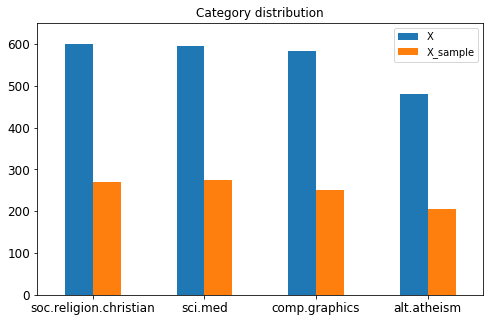

In [13]:
import matplotlib.pyplot as plt
%matplotlib inline

df_bar = pd.DataFrame({'X': X.category_name.value_counts(),
                       'X_sample': X_sample.category_name.value_counts()}, 
                        index=['soc.religion.christian','sci.med','comp.graphics','alt.atheism'])

ax = df_bar.plot(kind = 'bar',
                title = 'Category distribution',
                ylim = [0, 650],        
                rot = 0, fontsize = 12, figsize = (8,5))

---

### >>> Exercise 10 (take home):
We said that the `1` at the beginning of the fifth record represents the `00` term. Notice that there is another 1 in the same record. Can you provide code that can verify what word this 1 represents from the vocabulary. Try to do this as efficient as possible.

In [14]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text)

# We can obtain the feature names of the vectorizer, i.e., the terms
terms = count_vect.get_feature_names()[:100]

# convert from sparse array to normal array, first 100 terms of first 5 documents
X_array = X_counts[0:5, 0:100].toarray()

# get the indices of the 1s of the fifth record
X_array_idx = np.where(X_array[-1]==1)     # (array([ 0, 37]),)
print("Answer:", terms[X_array_idx[0][1]])

Answer: 01


---

### **>>> Exercise 11 (take home):** 
From the chart above, we can see how sparse the term-document matrix is; i.e., there is only one terms with frequency of `1` in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization

**1.** First, I tried to use heatmap to plot the sparse matrix. However, it consumed a lot of time even with only 5000 features.

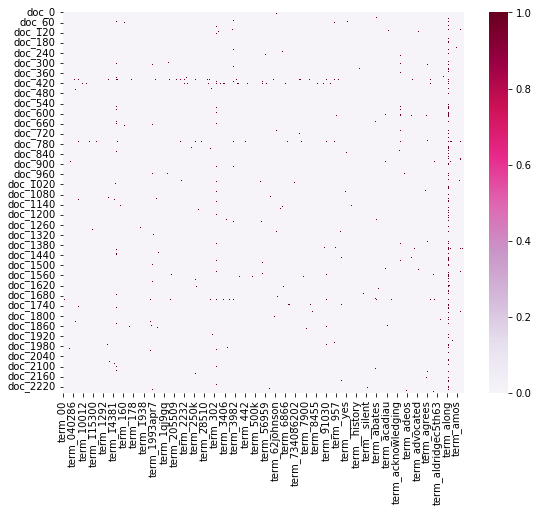

In [15]:
import seaborn as sns

n = 5000
    
# get a set of features
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names()[0:n]]

# obtain document index
plot_y = ["doc_"+ str(i) for i in list(X.index)]

plot_z = X_counts[:, 0:n].toarray()

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.figure(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=False)

**2.** Then, I tried to use `matplotlib.pyplot.spy()` to plot the whole sparse matrix. It runs really fast compared to heatmap, and we can observe the sparsity of the matrix.

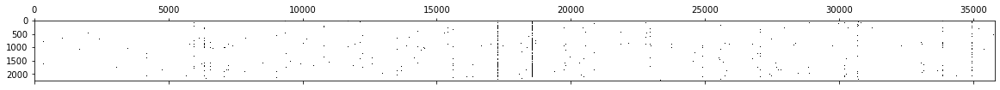

In [16]:
plt.figure(figsize=(20,20))
plt.spy(X_counts.toarray())

**3.** If we want to take a look of a specific range of features,`matplotlib.pyplot.spy()` also do the job well. For example, there seems to have some certain features occur a lot between feature 15000 and feature 20000.

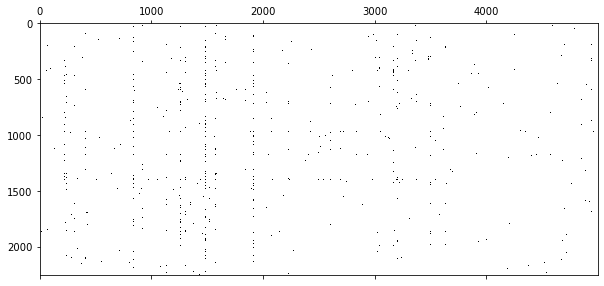

In [17]:
X_counts_partial = X_counts.toarray()[:,15000:20000]
plt.figure(figsize=(10,10))
plt.spy(X_counts_partial)

From the above figures, we can see that there are some certain words appear in many documents. Those words could be "a", "the", "and", or something else. We have to use some other ways to find those words out.

---

### >>> Exercise 12 (take home):
Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

In [18]:
from sklearn.decomposition import PCA

X_reduced = PCA(n_components = 3).fit_transform(X_counts.toarray())
X_reduced.shape

(2257, 3)

In [19]:
from mpl_toolkits.mplot3d import Axes3D

def show3D(elev, azim):
    fig = plt.figure()
    ax = Axes3D(fig)

    X_tmp = X_reduced[X['category'] == 0]
    ax.scatter(X_tmp[:,0].reshape(1,-1),X_tmp[:,1].reshape(1,-1),X_tmp[:,2].reshape(1,-1))
    X_tmp = X_reduced[X['category'] == 1]
    ax.scatter(X_tmp[:,0].reshape(1,-1),X_tmp[:,1].reshape(1,-1),X_tmp[:,2].reshape(1,-1), marker='^')
    X_tmp = X_reduced[X['category'] == 2]
    ax.scatter(X_tmp[:,0].reshape(1,-1),X_tmp[:,1].reshape(1,-1),X_tmp[:,2].reshape(1,-1), marker='*')
    X_tmp = X_reduced[X['category'] == 3]
    ax.scatter(X_tmp[:,0].reshape(1,-1),X_tmp[:,1].reshape(1,-1),X_tmp[:,2].reshape(1,-1), marker='+')

    ax.set_xlabel('X label')
    ax.set_ylabel('Y label')
    ax.set_zlabel('Z label')

    ax.view_init(elev=elev, azim=azim)
    # plt.savefig("../output/"+str(elev)+'_'+str(azim)+".png")
    plt.show()

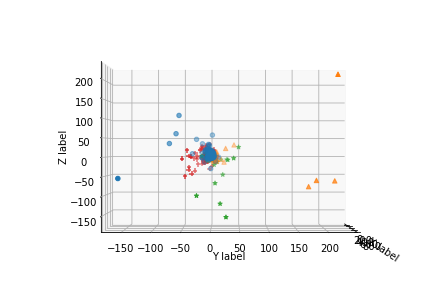

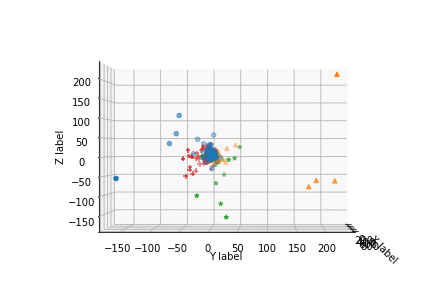

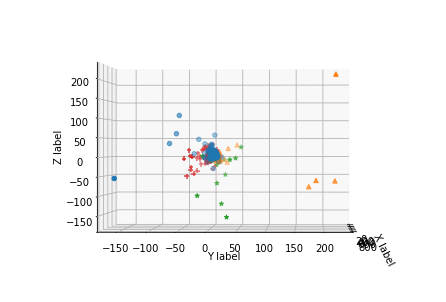

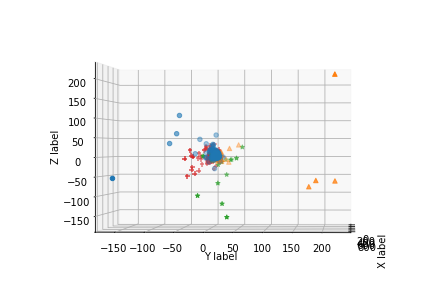

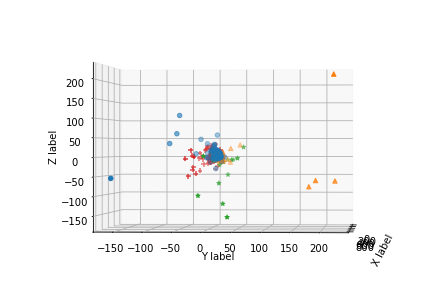

...

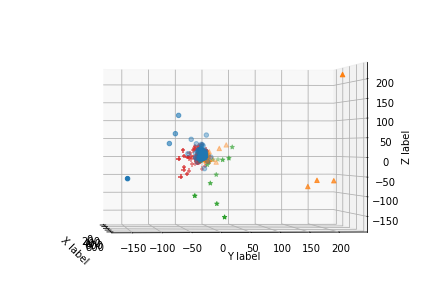

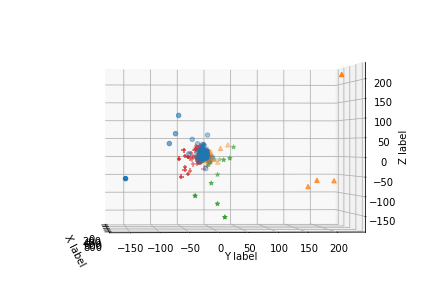

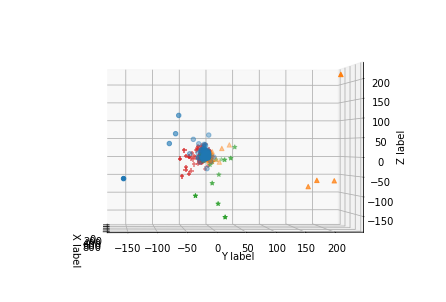

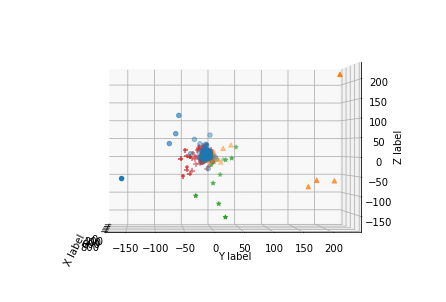

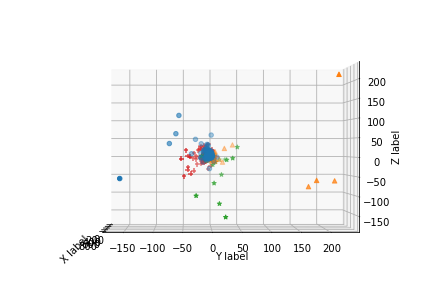

In [20]:
for i in range(360):
    show3D(0,i)

In [36]:
# for i in range(360):
#     show3D(i,0)

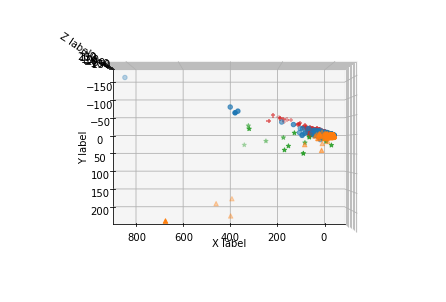

In [22]:
show3D(90,90)

From the above 3D plots, we can only see that the data points may have some grouping by category. However, like we see from the 2D visualization, there's no clear separation or boundry of these four categories. I've stored all the 720 images and made a short clip of rotating 360 degree for two directions, but there was still no much hint. I think reducing the dimension to 3 is still too small compared to the original dimension.

---

### >>> **Exercise 13 (take home):**
If you want a nicer interactive visualization here, I would encourage you try to install and use plotly to achieve this.

In [23]:
# construct the term_frequencies
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]

In [24]:
import plotly.graph_objects as go

def showFreq(start, end, step):
    fig = go.Figure()

    fig.add_trace(go.Bar(
        x=count_vect.get_feature_names()[start:end:step],
        y=term_frequencies[start:end:step]
    ))

    fig.update_layout(
        autosize=False,
        width=800,
        height=300,
        yaxis=dict(
            title_text="Frequency",
            tickmode="array",
            titlefont=dict(size=14),
        )
    )
    
    fig.update_traces(marker_color='rgb(0,0,0)',marker_line_color='rgb(0,0,0)')
    fig.update_yaxes(automargin=True)
    fig.show()

In Exercise 11, I ploted the sparse matrix for the words occuring in the documents, and found that there seems to have some certain features occur a lot between feature 15000 and feature 20000. Since we can zoomin certain area in the figure using plotly, I can find those words out!

In [25]:
for i in range(16000,19000,1000):
    showFreq(i,i+1000,1)

After zooming in the above figures, I found that "have" appears 4218 times, "if" appears 3208 times, "in" appears 11226 times, "is" appears 12343 times, "it" appears 8447 times. In conclusion, conjunctions, pronoun, auxiliary verb occur a lot in the documents, which is the same as our understanding to English writing.

In [26]:
showFreq(32000,33000,1)

Near feature 35000, I also found that "that" appears 10723 times, "the" appears 29825 times, "this" appears 5063 times, and "to" appears 17222 times.

---

### >>> **Exercise 14 (take home):** 
The chart above contains all the vocabulary, and it's computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise. 

In [27]:
print('Total features:', X_counts.shape[1])

x = 0
for i in range(0,X_counts.shape[1],100):
    x += 1
print("Reduced number of features:", x)

showFreq(0,X_counts.shape[1],100)

Total features: 35788
Reduced number of features: 358


We have a total of 35788 words, and I sampled 1 word every 100 words. Therefore, I reduced the number of terms to 385.

---

### >>> **Exercise 15 (take home):** 
Additionally, you can attempt to sort the terms on the `x-axis` by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called [long tail](https://en.wikipedia.org/wiki/Long_tail) (get familiar with this term since it will appear a lot in data mining and other statistics courses).

In [28]:
# Sort the terms by their frequency
terms = count_vect.get_feature_names()

dtype = [('Term', "S10"), ('Frequency', int)]
values = []

for i in range(len(terms)):
    values.append( (terms[i].encode('utf-8'),int(term_frequencies[i])) )
    
TF = np.array(values, dtype=dtype)       # create a structured array
TF = np.sort(TF, order='Frequency')[::-1]

# construct list of sorted terms and sorted frequencies
term_sorted = []
freq_sorted = []
for i in range(len(TF)):
    term_sorted.append(TF[i][0].decode('utf-8'))
    freq_sorted.append(TF[i][1])

In [29]:
# show the first n words with highest frequencies
def showSortedFreq(n):
    fig = go.Figure()

    fig.add_trace(go.Bar(
        x=term_sorted[:n],
        y=freq_sorted[:n]
    ))

    fig.update_layout(
        autosize=False,
        width=500,
        height=300,
        yaxis=dict(
            title_text="Frequency",
            titlefont=dict(size=14),
        )
    )

    fig.show()

In [30]:
showSortedFreq(200)

In [31]:
showSortedFreq(20)

To observe the power law distribution or the so called long tail, we can only show the first 200 highest frequency words. We can take a closer look by showing the first 20 highest frequency words. It is worth mentioning that "edu" is the in the 16th place, but it is not a common word in English essay. After investigating in the original dataset, I found that "edu" comes from email address of education organization. For example, ani@ms.uky.edu, djohnson@cs.ucsd.edu, etc.

In [32]:
# log scale of the first n words with highest frequencies
def showSortedFreq(n):
    fig = go.Figure()

    fig.add_trace(go.Bar(
        y=np.log10(freq_sorted[:n])
    ))

    fig.update_layout(
        autosize=False,
        width=500,
        height=300,
        yaxis=dict(
            title_text="Frequency",
            titlefont=dict(size=14),
        )
    )
    
    fig.update_traces(marker_color='rgb(0,0,0)',marker_line_color='rgb(0,0,0)')

    fig.show()

In [33]:
showSortedFreq(5000)

The above figure is a log scale plot of the first 5000 highest frequencies.

---

### >>> **Exercise 16 (take home):**
Try to generate the binarization using the `category_name` column instead. Does it work?

In [34]:
from sklearn import preprocessing

mlb = preprocessing.LabelBinarizer()
mlb.fit(X.category)
print(mlb.classes_)
X['bin_category'] = mlb.transform(X['category']).tolist()
X[:10]

[0 1 2 3]


,text,category,category_name,bin_category
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"[0, 0, 1, 0]"
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med,"[0, 0, 1, 0]"


In [35]:
mlb.fit(X.category_name)
print(mlb.classes_)
X['bin_category_name'] = mlb.transform(X['category_name']).tolist()
X[:10]

['alt.atheism' 'comp.graphics' 'sci.med' 'soc.religion.christian']


,text,category,category_name,bin_category,bin_category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[0, 1, 0, 0]","[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[0, 1, 0, 0]","[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[0, 0, 0, 1]","[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[0, 0, 0, 1]","[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[0, 0, 0, 1]","[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"[0, 0, 0, 1]","[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"[0, 0, 0, 1]","[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"[0, 0, 1, 0]","[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"[0, 0, 1, 0]","[0, 0, 1, 0]"
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med,"[0, 0, 1, 0]","[0, 0, 1, 0]"


Performing binarization on the `category_name` column works, and the result is the same as performing binarization on the `category` column.

---